<a href="https://colab.research.google.com/github/Yahred/evolutionary-computation/blob/main/EA3DFn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Animación de la evolución de un algoritmo genético

Nuestro algoritmo tratará de encontrar el máximo de la función



Cargamos las bibliotecas necesarias

In [1]:
pip install deap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 2.2 MB/s eta 0:00:00


In [2]:
from mpl_toolkits.mplot3d import Axes3D
from math import exp
from deap import base, creator, tools, algorithms
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

import numpy as np
import matplotlib.pyplot as plt

import random

In [3]:
def f(x, y):
  return 3 * ((1 - x)**2) * np.exp(-x**2 - (y + 1)**2) - 10 * (x/5 - x**3 - y**5) * np.exp(-x**2 - y**2) - (1/3)*(np.exp(-(x + 1)**2 - y**2))

Vamos a echar un vistazo a la función

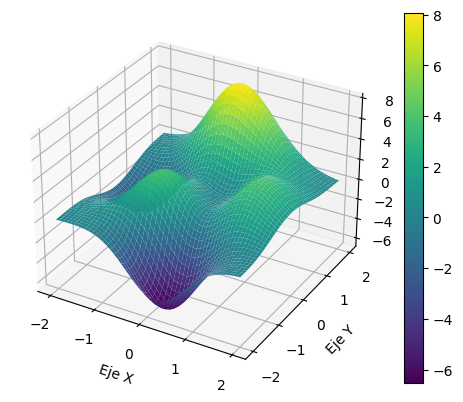

In [11]:
x = np.arange(-2, 2, 0.01)
y = np.arange(-2, 2, 0.01)

X, Y = np.meshgrid(x, y)
Z = f(X, Y)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

surf = ax.plot_surface(X, Y, Z, cmap='viridis')

fig.colorbar(surf)

ax.set_xlabel('Eje X')
ax.set_ylabel('Eje Y')
ax.set_zlabel('Eje Z')

plt.show()

Definimos nuestra función de evaluación

Que simplemente retornará el valor de la función en el punto x,y

In [9]:
def fitness(ind):
  x, y = ind
  z = f(x, y)
  return z,

Definimos a nuestro individuo

In [37]:
creator.create("FitnessMax", base.Fitness, weights=(1.0,))
creator.create("Individual", list, fitness=creator.FitnessMax)

stats = tools.Statistics(key=lambda ind: ind.fitness.values)
stats.register("avg", np.mean)

toolbox = base.Toolbox()
toolbox.register("attr_float", random.uniform, -2, 2)
toolbox.register("individual", tools.initRepeat, creator.Individual, toolbox.attr_float, n=2)
toolbox.register("population", tools.initRepeat, list, toolbox.individual)
toolbox.register("evaluate", fitness)

toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=1, indpb=0.2)

toolbox.register("select", tools.selTournament, tournsize=3)

/usr/local/lib/python3.10/dist-packages/deap/creator.py:185: RuntimeWarning: A class named 'FitnessMax' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  warnings.warn("A class named '{0}' has already been created and it "
/usr/local/lib/python3.10/dist-packages/deap/creator.py:185: RuntimeWarning: A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  warnings.warn("A class named '{0}' has already been created and it "


Iniciamos la evolución

In [38]:
pop = toolbox.population(n=100)

n_generations = 50
cx_prob = 0.7
mut_prob = 0.1

ind_por_generacion = []

for gen in range(n_generations):
  pop, _ = algorithms.eaSimple(pop, toolbox, cxpb=cx_prob, mutpb=mut_prob, ngen=1, stats=stats, verbose=False)
  ind_por_generacion.append(list(pop))

ganador = tools.selBest(pop, k=1)[0]

In [39]:
ganador

[-0.009317578789953367, 1.581367959689973]

In [40]:
x, y = ganador
f(x, y)

8.106213589442342

Animación de la evolución de los individuos a través de las generaciones

<ipython-input-41-cd94df017e40>:31: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  surf = ax.scatter(X, Y, Z, cmap='')


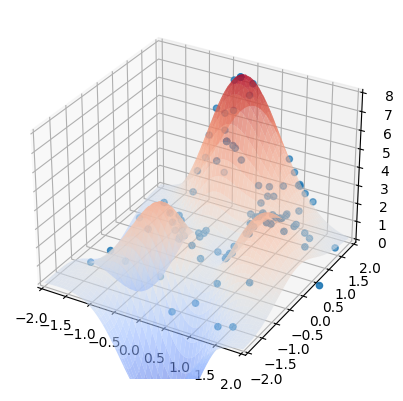

In [41]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

x_surface = np.arange(-2, 2, 0.01)
y_surface = np.arange(-2, 2, 0.01)

X_surface, Y_surface = np.meshgrid(x_surface, y_surface)
Z_surface = f(X_surface, Y_surface)

surf = ax.plot_surface(X_surface, Y_surface, Z_surface, cmap='coolwarm', alpha=0.6)

x = np.array([x for (x, _) in ind_por_generacion[0]])
y = np.array([y for (_, y) in ind_por_generacion[0]])
z = np.array(f(x, y))

sc = ax.scatter(x, y, z)

def animate(t):
    ax.clear()
    surf = ax.plot_surface(X_surface, Y_surface, Z_surface, cmap='coolwarm', alpha=0.6)

    generacion = ind_por_generacion[t]
    X = np.array([x for (x, _) in generacion])
    Y = np.array([y for (_, y) in generacion])
    Z = f(X, Y)

    ax.set_xlim(-2, 2)
    ax.set_ylim(-2, 2)
    ax.set_zlim(0, 8)

    surf = ax.scatter(X, Y, Z, cmap='')
    return surf,

ani = animation.FuncAnimation(fig, animate, frames=np.arange(0, len(ind_por_generacion)), interval=500)

HTML(ani.to_jshtml())